## Deploy ResNet50 model using Triton

This guide aims to provide step-by-step instructions for establishing an inference infrastructure to deploy deep learning pipelines utilizing the Triton server.


To begin, import the required libraries:

In [1]:
import numpy as np
from torchvision import transforms
from PIL import Image
import tritonclient.http as httpclient
from tritonclient.utils import triton_to_np_dtype

Next, construct preprocessing functions to handle the data and ensure it meets the model's requirements.

In [2]:
# preprocessing function
def rn50_preprocess(img_path):
    img = Image.open(img_path)
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    return np.expand_dims(preprocess(img).numpy(),axis=0)

Create a function that allows you to visualize the image at different stages of the process.

In [3]:
def plt_img(img_path):
    from IPython.display import display
    pil_im = Image.open(img_path)
    display(pil_im)

Next, we will execute the ResNet50 model on three distinct images downloaded from the web.

Throughout this process, we will perform the following steps:

1. Create a client object and establish a connection with the Triton Inference Server.
2. Initialize the InferInput object, which will contain the data we send to Triton.
3. Send requests to the Triton Inference Server and retrieve the response.

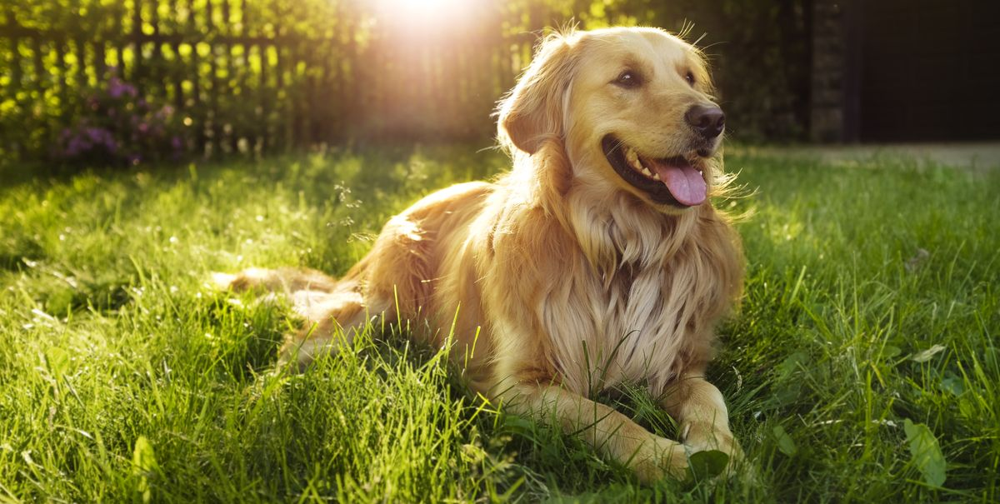

Class | Probability
[[207.        11.356841]
 [212.         9.102118]
 [222.         8.791483]
 [208.         8.410839]
 [852.         7.991486]]


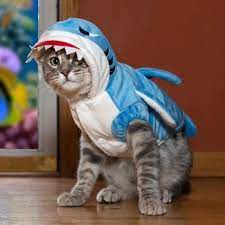

Class | Probability
[[285.         9.262123]
 [292.         9.046752]
 [281.         8.124939]
 [282.         7.72466 ]
 [917.         7.227952]]


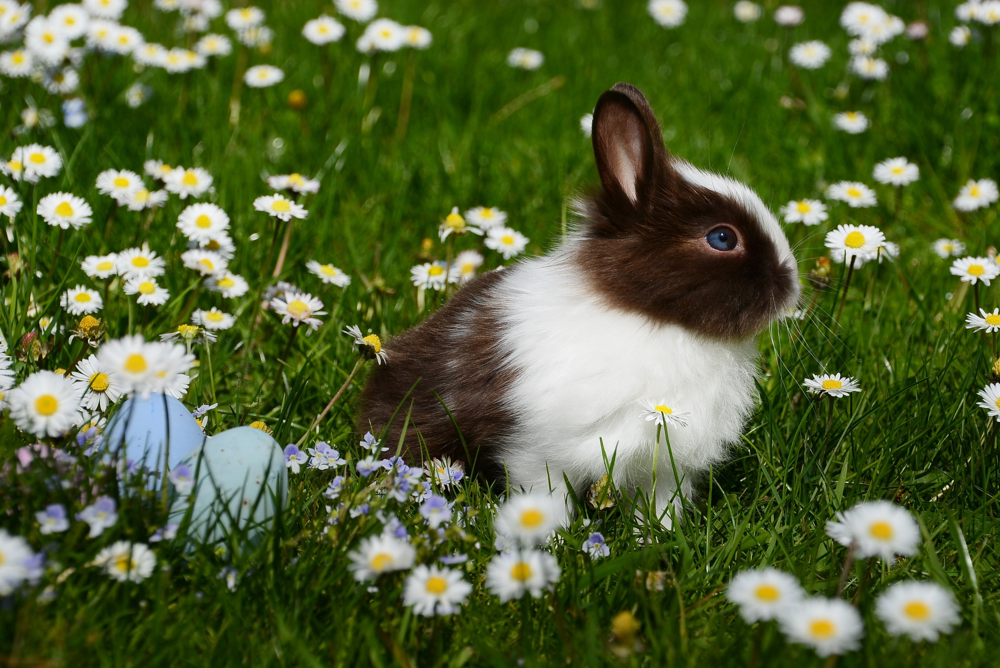

Class | Probability
[[332.        11.948779]
 [331.        11.791587]
 [330.         9.851976]
 [338.         9.006971]
 [333.         7.099026]]


In [4]:

img_list = ["images/img1.jpg","images/img2.jpg", "images/img3.jpg"]
for img in img_list:
    plt_img(img)
    transformed_img = rn50_preprocess(img)

    # Setting up client
    client = httpclient.InferenceServerClient(url="localhost:8000")

    # Create the InferInput that we'll be sending to Triton 
    inputs = httpclient.InferInput("data_0", transformed_img.shape, datatype="FP32")
    inputs.set_data_from_numpy(transformed_img, binary_data=True)

    outputs = httpclient.InferRequestedOutput("fc6_1", binary_data=True, class_count=1000)

    # Querying the server
    results = client.infer(model_name="densenet_onnx", inputs=[inputs], outputs=[outputs])
    inference_output = results.as_numpy('fc6_1').astype(str)
    
    np_results = np.squeeze(inference_output)[:5]
    print("Class | Probability")
    print(np.array([tuple(map(float, item.split(':')[::-1])) for item in np_results]))